# *E-commerce Database Analysis and Predictive Modeling*

In [21]:
pip install xgboost


[notice] A new release of pip is available: 23.3.2 -> 25.1.1
[notice] To update, run: C:\Users\Mo.Tech\AppData\Local\Programs\Python\Python312\python.exe -m pip install --upgrade pip


In [80]:
%matplotlib inline

### `Import libraries`

In [81]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pyodbc
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.impute import SimpleImputer
import xgboost as xgb
import joblib
import warnings
warnings.filterwarnings('ignore')

`Set plot style`

In [82]:
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")

### `Connect to the SQL Server database`

In [34]:
# Replace these with your actual connection details
server = 'DESKTOP-SCQGL89'
database = 'ecommerce_db'

In [32]:
# Create the connection string
conn_str = f'DRIVER={{ODBC Driver 17 for SQL Server}};SERVER={server};DATABASE={database};Trusted_Connection=yes;'

In [67]:
# For actual implementation, uncomment this:
try:
    conn = pyodbc.connect(conn_str)
    print(f"Successfully connected to {database} on {server}")
except Exception as e:
    print(f"Error connecting to database: {e}")
    # If connection fails, we'll use sample data instead

Successfully connected to ecommerce_db on DESKTOP-SCQGL89


In [68]:
# Read each table into a DataFrame
orders = pd.read_sql("SELECT * FROM orders", conn)
customers = pd.read_sql("SELECT * FROM customers", conn)
products = pd.read_sql("SELECT * FROM products", conn)
categories = pd.read_sql("SELECT * FROM categories", conn)
order_details = pd.read_sql("SELECT * FROM order_details", conn)
reviews = pd.read_sql("SELECT * FROM reviews", conn)

### `Show Sample Data`

2025-05-21 14:48:29.690 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.



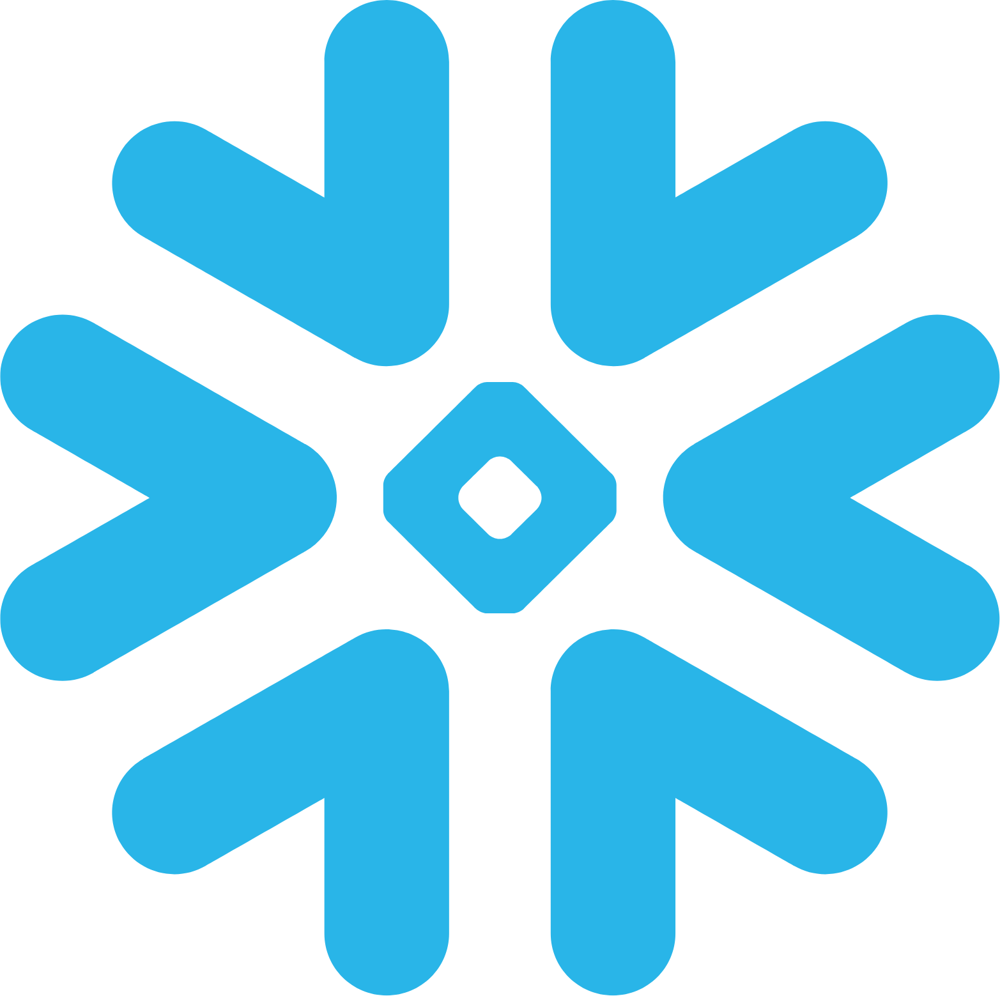

In [69]:
orders.head()

In [70]:
# Store DataFrames in a dictionary for easier access
dataframes = {
    'orders': orders,
    'customers': customers,
    'products': products,
    'categories': categories,
    'order_details': order_details,
    'reviews': reviews
}

### `Inspect the data`

In [71]:
for table_name, df in dataframes.items():
    print(f"\nTable: {table_name}")
    print(f"Shape: {df.shape}")
    print(df.head(3))
    print("-" * 80)


Table: orders
Shape: (10200, 5)
   id  customer_id          order_date  total_amount      status
0   1           13 2025-04-05 09:06:50        521.85     shipped
1   2           15 2025-03-05 08:27:50        436.91  processing
2   3            9 2025-04-21 21:19:19       7711.55   cancelled
--------------------------------------------------------------------------------

Table: customers
Shape: (250, 7)
   id first_name last_name                        email         phone  \
0   1    Loretta    Weaver  matthewsstephen@example.net  +10000000001   
1   2   Jennifer    Kelley          xwilson@example.net  +10000000002   
2   3    Michael  Mcintosh   allisoncollins@example.com  +10000000003   

                                             address   registration_date  
0      8649 Gonzales Stream\r\nJeffreyfort, NV 63120 2025-01-15 18:12:50  
1         7838 Dustin Skyway\r\nLake Robin, AS 24112 2025-03-17 03:46:07  
2  68025 David Squares Apt. 363\r\nLake Josephsta... 2025-04-25 16:08:23  

### `Data Exploration - Check for missing values`

In [72]:
print("Missing values in each table:")
for table_name, df in dataframes.items():
    print(f"\n{table_name}:")
    print(df.isnull().sum())

Missing values in each table:

orders:
id              0
customer_id     0
order_date      0
total_amount    0
status          0
dtype: int64

customers:
id                   0
first_name           0
last_name            0
email                0
phone                0
address              0
registration_date    0
dtype: int64

products:
id                0
name              0
description       0
price             0
category_id       0
supplier_id       0
sku               0
stock_quantity    0
dtype: int64

categories:
id              0
name            0
description     0
parent_id      15
dtype: int64

order_details:
id            0
order_id      0
product_id    0
quantity      0
unit_price    0
dtype: int64

reviews:
id             0
product_id     0
customer_id    0
rating         0
comment        0
review_date    0
dtype: int64


In [73]:
dataframes['categories']['parent_id'].unique()

array([nan,  3.,  2.,  4.,  5.,  8.,  9.,  6.])

In [74]:
dataframes['categories']['parent_id'].shape

(30,)

In [75]:
# Merge to get parent category name
categories_with_parent = categories.merge(
    categories[['id', 'name']].rename(columns={'id': 'parent_id', 'name': 'parent_name'}),
    how='left',
    on='parent_id'
)

print(categories_with_parent[['id', 'name', 'parent_id', 'parent_name']])

    id      name  parent_id parent_name
0    1      Part        NaN         NaN
1    2   Program        NaN         NaN
2    3     Large        NaN         NaN
3    4      Hold        NaN         NaN
4    5    Speech        NaN         NaN
5    6      Born        3.0       Large
6    7    Recent        2.0     Program
7    8    Window        2.0     Program
8    9      Half        4.0        Hold
9   10     Adult        5.0      Speech
10  11     Table        NaN         NaN
11  12   Mission        NaN         NaN
12  13     Share        NaN         NaN
13  14      Free        NaN         NaN
14  15    Letter        NaN         NaN
15  16  Marriage        NaN         NaN
16  17       Who        NaN         NaN
17  18      Game        NaN         NaN
18  19    Choose        NaN         NaN
19  20    Energy        NaN         NaN
20  21      Over        5.0      Speech
21  22     Carry        8.0      Window
22  23     Glass        5.0      Speech
23  24        Or        9.0        Half


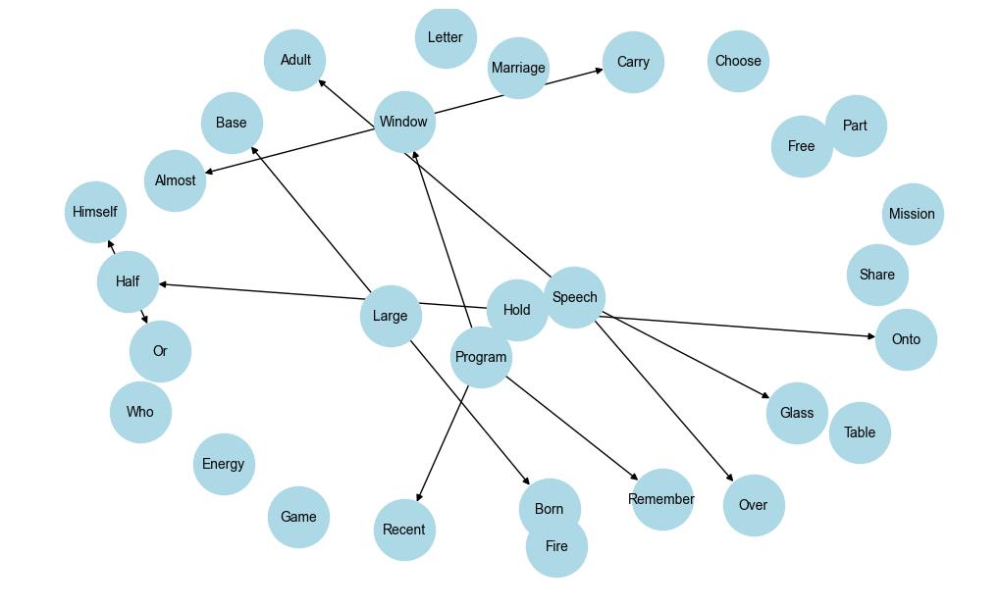

In [85]:
import networkx as nx
import matplotlib.pyplot as plt

G = nx.DiGraph()

for _, row in categories.iterrows():
    if pd.isna(row['parent_id']):
        G.add_node(row['name'])
    else:
        parent_name = categories.loc[categories['id'] == row['parent_id'], 'name'].values[0]
        G.add_edge(parent_name, row['name'])

plt.figure(figsize=(10, 6))
nx.draw(G, with_labels=True, node_size=2000, node_color='lightblue', font_size=10)
plt.show()

In [86]:
# Fill NaN in 'parent_id' column with the median of existing parent_ids
median_parent_id = dataframes['categories']['parent_id'].median()
dataframes['categories']['parent_id'].fillna(median_parent_id, inplace=True)

In [87]:
print("Missing values in each table:")
for table_name, df in dataframes.items():
    print(f"\n{table_name}:")
    missing = df.isnull().sum()
    if missing.sum() > 0:
        print(missing[missing > 0])
    else:
        print("No missing values")

Missing values in each table:

orders:
No missing values

customers:
No missing values

products:
No missing values

categories:
No missing values

order_details:
No missing values

reviews:
No missing values


### `Explore order status distribution`

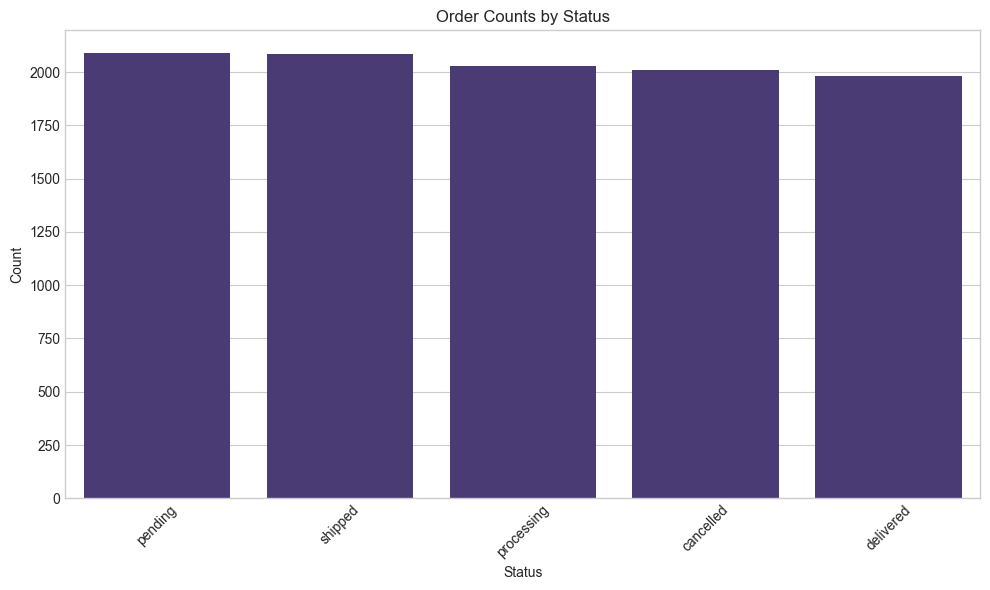

In [88]:
plt.figure(figsize=(10, 6))
order_status_counts = orders['status'].value_counts()
sns.barplot(x=order_status_counts.index, y=order_status_counts.values)
plt.title('Order Counts by Status')
plt.xlabel('Status')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### `Explore product categories`

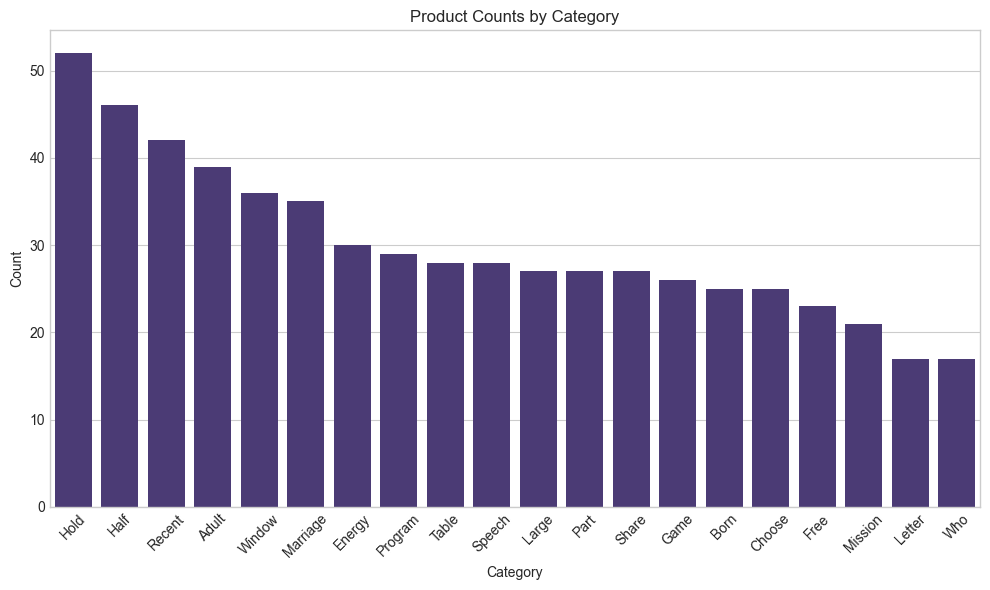

In [89]:
plt.figure(figsize=(10, 6))
product_category_counts = products['category_id'].value_counts()
# Map category IDs to names
category_map = dict(zip(categories['id'], categories['name']))
product_category_counts.index = product_category_counts.index.map(lambda x: category_map.get(x, f"Category {x}"))
sns.barplot(x=product_category_counts.index, y=product_category_counts.values)
plt.title('Product Counts by Category')
plt.xlabel('Category')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### `Explore product price distribution`

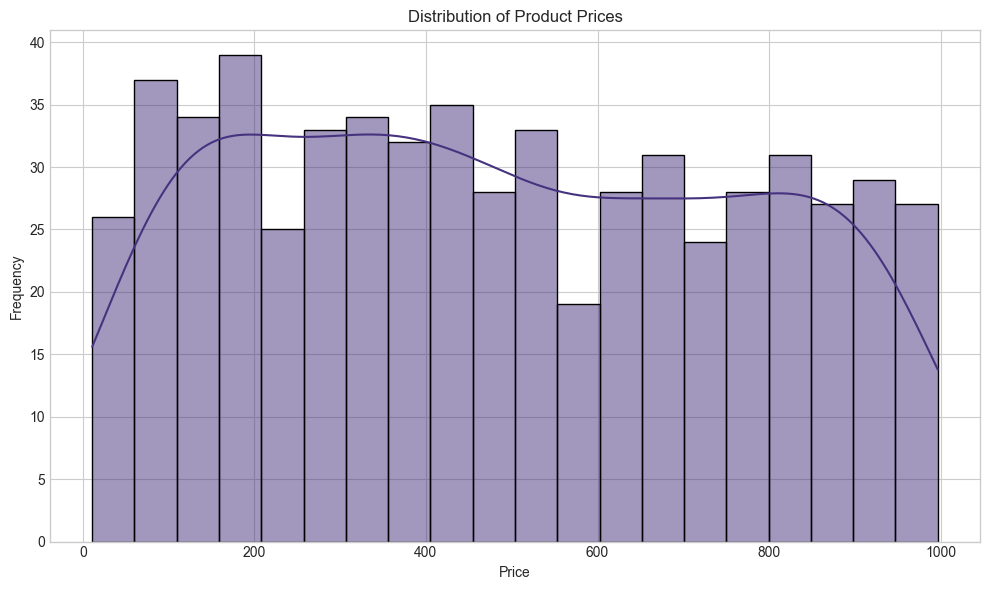

In [90]:
plt.figure(figsize=(10, 6))
sns.histplot(products['price'].dropna(), bins=20, kde=True)
plt.title('Distribution of Product Prices')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

### `Explore customer review ratings`

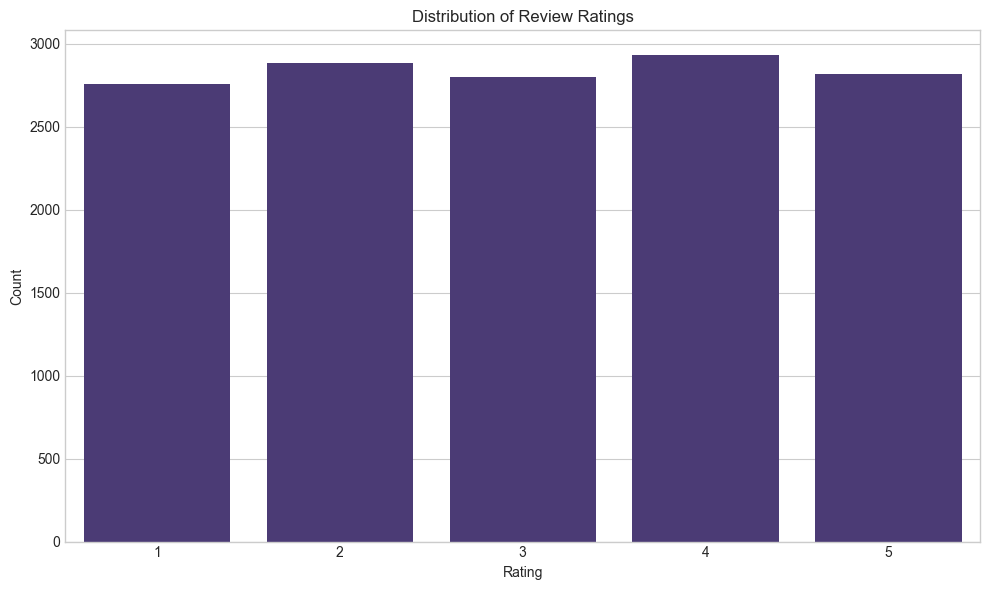

In [91]:
plt.figure(figsize=(10, 6))
review_ratings = reviews['rating'].value_counts().sort_index()
sns.barplot(x=review_ratings.index, y=review_ratings.values)
plt.title('Distribution of Review Ratings')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

### `Explore order trends over time`

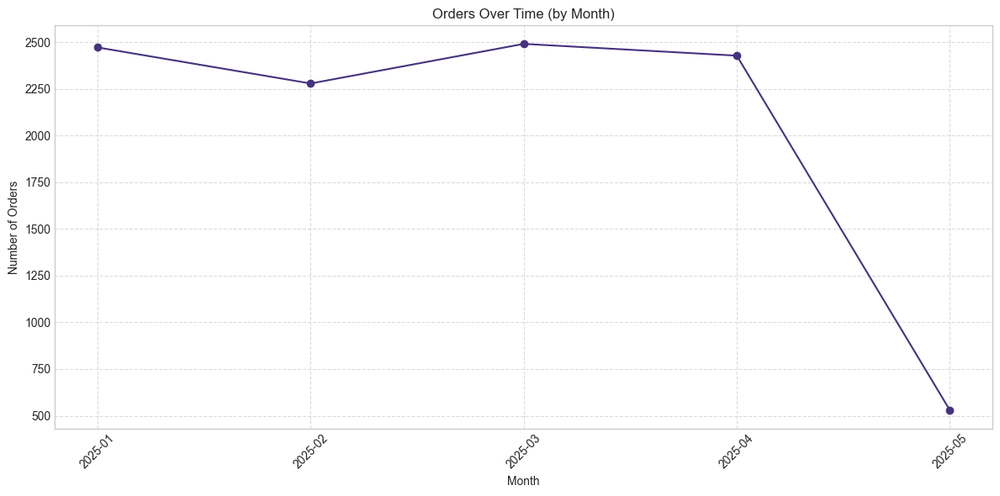

In [92]:
plt.figure(figsize=(12, 6))
df_orders = orders.copy()
df_orders['order_month'] = pd.to_datetime(df_orders['order_date']).dt.to_period('M')
orders_by_month = df_orders.groupby('order_month').size()
plt.plot(range(len(orders_by_month)), orders_by_month.values, marker='o')
plt.title('Orders Over Time (by Month)')
plt.xlabel('Month')
plt.ylabel('Number of Orders')
plt.xticks(range(len(orders_by_month)), [str(m) for m in orders_by_month.index], rotation=45)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### `Explore customer registration trends`

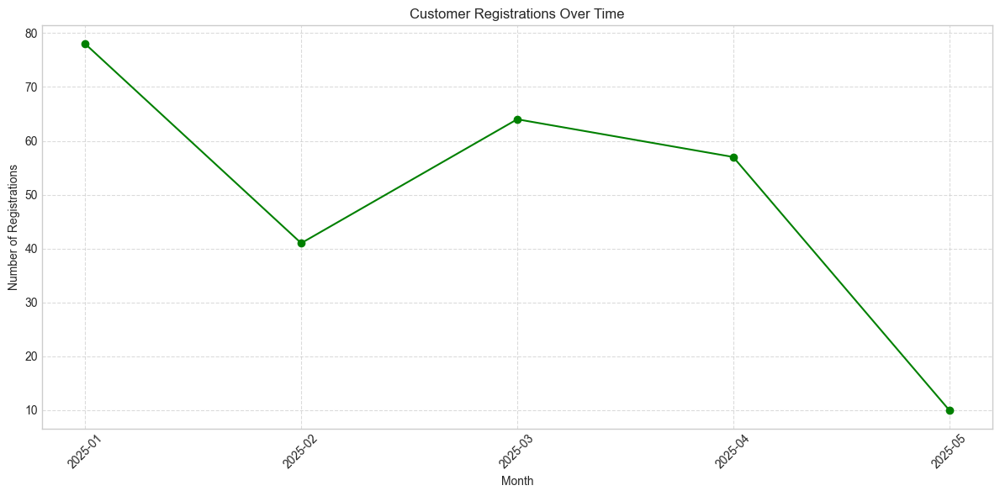

In [93]:
plt.figure(figsize=(12, 6))
df_customers = customers.copy()
df_customers['registration_month'] = pd.to_datetime(df_customers['registration_date']).dt.to_period('M')
registrations_by_month = df_customers.groupby('registration_month').size()
plt.plot(range(len(registrations_by_month)), registrations_by_month.values, marker='o', color='green')
plt.title('Customer Registrations Over Time')
plt.xlabel('Month')
plt.ylabel('Number of Registrations')
plt.xticks(range(len(registrations_by_month)), [str(m) for m in registrations_by_month.index], rotation=45)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### `Analyze order value distribution`

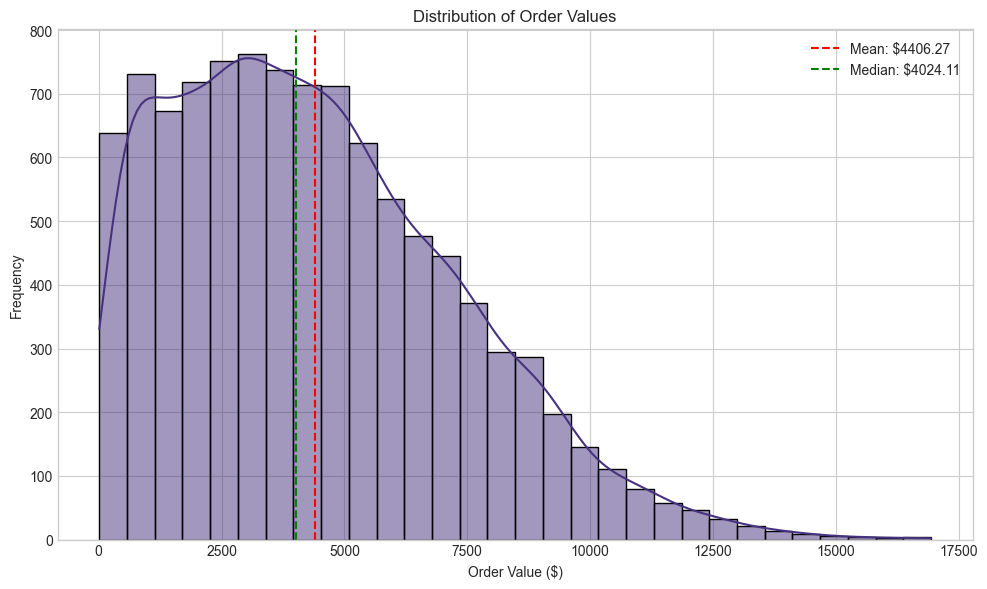

In [94]:
plt.figure(figsize=(10, 6))
sns.histplot(orders['total_amount'], bins=30, kde=True)
plt.title('Distribution of Order Values')
plt.xlabel('Order Value ($)')
plt.ylabel('Frequency')
plt.axvline(orders['total_amount'].mean(), color='r', linestyle='--', label=f'Mean: ${orders["total_amount"].mean():.2f}')
plt.axvline(orders['total_amount'].median(), color='g', linestyle='--', label=f'Median: ${orders["total_amount"].median():.2f}')
plt.legend()
plt.tight_layout()
plt.show()

### `Calculate top-selling products`

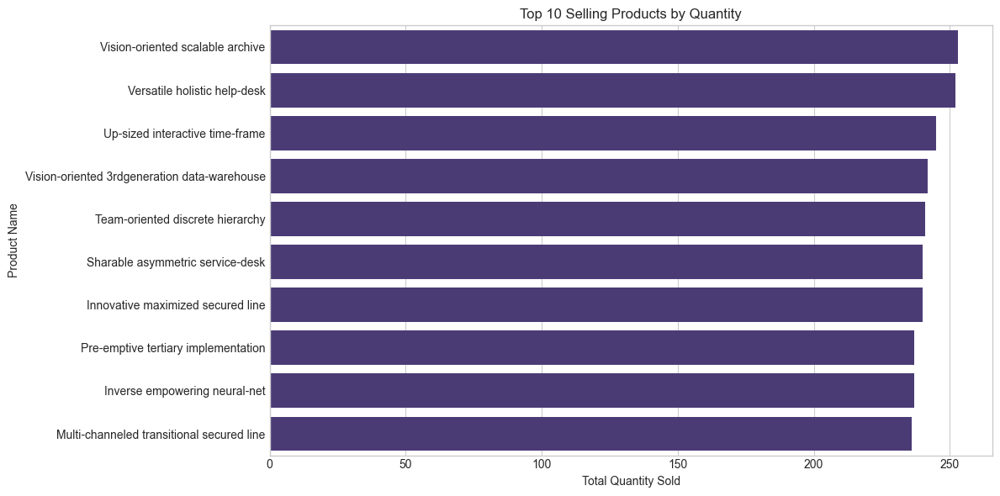

In [95]:
# Join order_details with products to get product names
top_selling_products = order_details.groupby('product_id')['quantity'].sum().reset_index()
top_selling_products = top_selling_products.merge(products[['id', 'name']], left_on='product_id', right_on='id')
top_selling_products = top_selling_products.sort_values('quantity', ascending=False).head(10)

plt.figure(figsize=(12, 6))
sns.barplot(x='quantity', y='name', data=top_selling_products)
plt.title('Top 10 Selling Products by Quantity')
plt.xlabel('Total Quantity Sold')
plt.ylabel('Product Name')
plt.tight_layout()
plt.show()

### `Calculate correlation matrix for numeric variables`

In [96]:
# Merge orders and order details for correlation analysis
orders_details = pd.merge(
    orders, 
    order_details, 
    left_on='id', 
    right_on='order_id'
)

In [97]:
# Select numeric columns
numeric_cols = orders_details.select_dtypes(include=['int64', 'float64']).columns
correlation = orders_details[numeric_cols].corr()

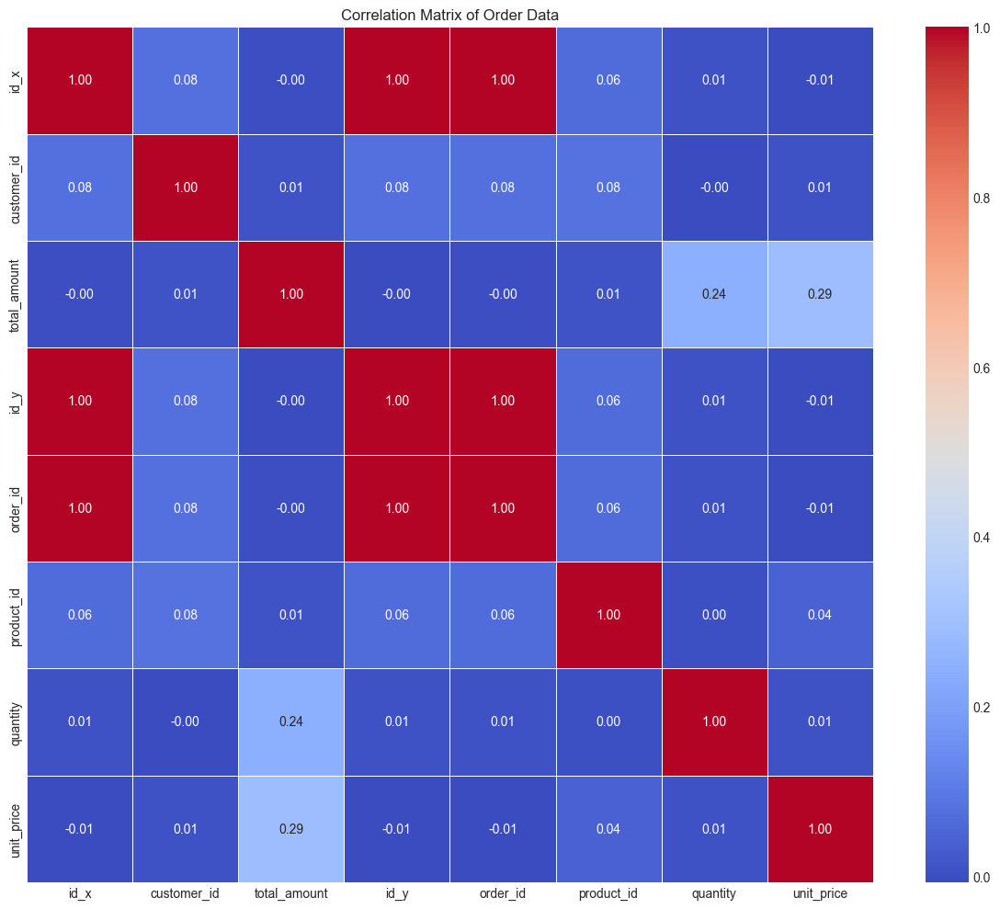

In [98]:
# Plot correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation, annot=True, cmap='coolwarm', linewidths=.5, fmt='.2f')
plt.title('Correlation Matrix of Order Data')
plt.tight_layout()
plt.show()

### `Data preparation for modeling`

In [99]:
# Create a DataFrame that merges orders, customers, and order details
# Merge orders with customers
df_merged = pd.merge(
    orders,
    customers,
    left_on='customer_id',
    right_on='id',
    suffixes=('_order', '_customer')
)

In [100]:
# Aggregate order details to get product count and total quantity per order
order_agg = order_details.groupby('order_id').agg({
    'product_id': 'count',
    'quantity': 'sum'
}).reset_index()
order_agg.columns = ['order_id', 'product_count', 'total_quantity']

In [101]:
# Merge with aggregated order details
df_merged = pd.merge(
    df_merged,
    order_agg,
    left_on='id_order',
    right_on='order_id',
    how='left'
)

2025-05-21 15:01:32.821 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


Merged data shape: (10200, 15)



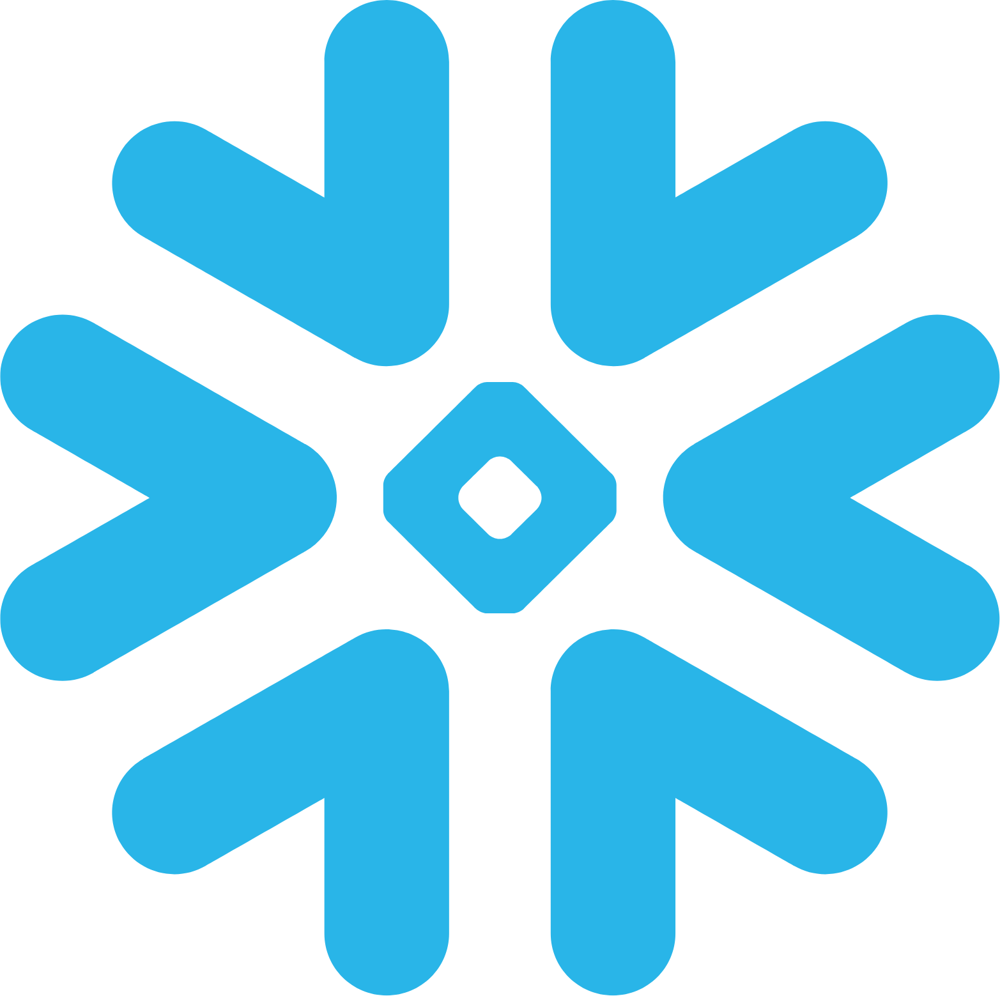

In [102]:
# Display the merged data
print("Merged data shape:", df_merged.shape)
df_merged.head()

### `Feature engineering`

In [103]:
# Convert dates to datetime
df_merged['registration_date'] = pd.to_datetime(df_merged['registration_date'])
df_merged['order_date'] = pd.to_datetime(df_merged['order_date'])

In [104]:
# Calculate days as customer
df_merged['days_as_customer'] = (df_merged['order_date'] - df_merged['registration_date']).dt.days

In [105]:
# Create month and day of week features
df_merged['order_month'] = df_merged['order_date'].dt.month
df_merged['order_day_of_week'] = df_merged['order_date'].dt.dayofweek

In [106]:
# Calculate customer average order value (excluding current order)
customer_avg_order = df_merged.groupby('customer_id')['total_amount'].transform('mean')
df_merged['customer_avg_order'] = customer_avg_order

2025-05-21 15:02:34.457 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.



Feature engineering completed.
New features added: days_as_customer, order_month, order_day_of_week, customer_avg_order



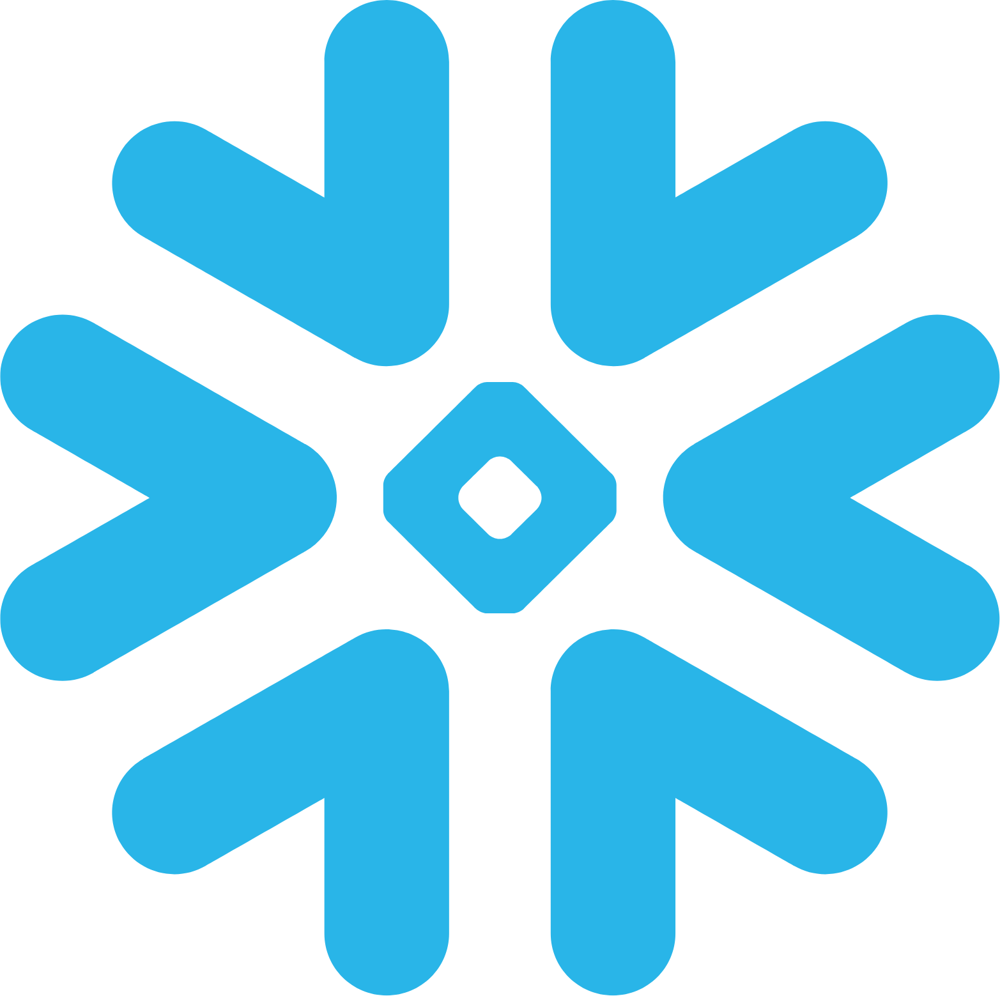

In [107]:
print("\nFeature engineering completed.")
print("New features added: days_as_customer, order_month, order_day_of_week, customer_avg_order")
df_merged[['days_as_customer', 'order_month', 'order_day_of_week', 'customer_avg_order']].head()

### `Prepare data for modeling`

In [108]:
# Select features and target
features = ['days_as_customer', 'product_count', 'total_quantity', 
            'order_month', 'order_day_of_week', 'customer_avg_order']
target = 'total_amount'

In [109]:
# Handle missing values
df_model = df_merged[features + [target]].copy()
print("\nMissing values before handling:")
df_model.isnull().sum()


Missing values before handling:


days_as_customer      0
product_count         0
total_quantity        0
order_month           0
order_day_of_week     0
customer_avg_order    0
total_amount          0
dtype: int64

In [110]:
# Fill missing values
df_model = df_model.fillna({
    'days_as_customer': df_model['days_as_customer'].median(),
    'product_count': df_model['product_count'].median(),
    'total_quantity': df_model['total_quantity'].median(),
    'customer_avg_order': df_model['customer_avg_order'].median()
})

In [111]:
print("\nMissing values after handling:")
df_model.isnull().sum()


Missing values after handling:


days_as_customer      0
product_count         0
total_quantity        0
order_month           0
order_day_of_week     0
customer_avg_order    0
total_amount          0
dtype: int64

### `Split data into training and testing sets`

In [112]:
X = df_model[features]
y = df_model[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Training set shape: {X_train.shape}")
print(f"Testing set shape: {X_test.shape}")

Training set shape: (8160, 6)
Testing set shape: (2040, 6)


### `Define preprocessing pipeline`

In [113]:
# Preprocessing for numerical features
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns

# Define preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='median')),
            ('scaler', StandardScaler())
        ]), numeric_features)
    ]
)

### `Train Random Forest model`

In [114]:
# Define Random Forest pipeline
rf_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', RandomForestRegressor(n_estimators=100, random_state=42))
])

# Train the model
print("Training Random Forest model...")
rf_pipeline.fit(X_train, y_train)

Training Random Forest model...


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['days_as_customer', 'product_count', 'total_quantity',
       'customer_avg_order'],
      dtype='object'))])),
                ('model', RandomForestRegressor(random_state=42))])

In [115]:
# Make predictions
rf_predictions = rf_pipeline.predict(X_test)

# Calculate metrics
rf_mse = mean_squared_error(y_test, rf_predictions)
rf_rmse = np.sqrt(rf_mse)
rf_mae = mean_absolute_error(y_test, rf_predictions)
rf_r2 = r2_score(y_test, rf_predictions)

print(f"\nRandom Forest Performance:")
print(f"MSE: {rf_mse:.2f}")
print(f"RMSE: {rf_rmse:.2f}")
print(f"MAE: {rf_mae:.2f}")
print(f"R²: {rf_r2:.4f}")


Random Forest Performance:
MSE: 2855850.73
RMSE: 1689.93
MAE: 1280.47
R²: 0.6605


### `Train XGBoost model`

In [116]:
# Define XGBoost pipeline
xgb_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42))
])

# Train the model
print("\nTraining XGBoost model...")
xgb_pipeline.fit(X_train, y_train)


Training XGBoost model...


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['days_as_customer', 'product_count', 'total_quantity',
       'customer_avg_order'],
      dtype='object'))])),
                ('model',
                 XGBRegressor(base_score=None, booster=None, callbacks=None,
                              colsample_bylevel=Non...
                              feature_types=None, feature_weights=None,
                              gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=0.1,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=100, n_jobs=None,
                              num_parallel_tree=None, ...))])

In [117]:
# Make predictions
xgb_predictions = xgb_pipeline.predict(X_test)

# Calculate metrics
xgb_mse = mean_squared_error(y_test, xgb_predictions)
xgb_rmse = np.sqrt(xgb_mse)
xgb_mae = mean_absolute_error(y_test, xgb_predictions)
xgb_r2 = r2_score(y_test, xgb_predictions)

print(f"\nXGBoost Performance:")
print(f"MSE: {xgb_mse:.2f}")
print(f"RMSE: {xgb_rmse:.2f}")
print(f"MAE: {xgb_mae:.2f}")
print(f"R²: {xgb_r2:.4f}")


XGBoost Performance:
MSE: 2642238.19
RMSE: 1625.50
MAE: 1241.79
R²: 0.6859


### `Hyperparameter tuning for Random Forest`

In [118]:
# Define parameter grid for Random Forest
print("\nPerforming hyperparameter tuning for Random Forest...")
rf_param_grid = {
    'model__n_estimators': [50, 100],
    'model__max_depth': [None, 10, 20],
    'model__min_samples_split': [2, 5]
}

# Grid search for Random Forest
rf_grid_search = GridSearchCV(
    rf_pipeline, 
    rf_param_grid, 
    cv=3, 
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=1
)

rf_grid_search.fit(X_train, y_train)


Performing hyperparameter tuning for Random Forest...
Fitting 3 folds for each of 12 candidates, totalling 36 fits


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         Index(['days_as_customer', 'product_count', 'total_quantity',
       'customer_avg_order'],
      dtype='object'))])),
                                       ('model',
                                        RandomForestRegressor(random_state=42))]),
             n_jobs=-1,
             param_grid={'model__max_depth': [None, 10, 20],
                         'model__min_samples_split': [2, 5],
                         'model__n_estimators': [50, 100]},
             scoring='neg_mean_squared_error', verbose=1)

In [119]:
rf_best_model = rf_grid_search.best_estimator_

In [123]:
print(f"\nBest parameters for Random Forest: {rf_grid_search.best_params_}")


Best parameters for Random Forest: {'model__max_depth': 10, 'model__min_samples_split': 5, 'model__n_estimators': 100}


In [124]:
# Make predictions with best model
rf_best_predictions = rf_best_model.predict(X_test)

# Calculate metrics for tuned model
rf_best_mse = mean_squared_error(y_test, rf_best_predictions)
rf_best_rmse = np.sqrt(rf_best_mse)
rf_best_mae = mean_absolute_error(y_test, rf_best_predictions)
rf_best_r2 = r2_score(y_test, rf_best_predictions)

print(f"\nTuned Random Forest Performance:")
print(f"MSE: {rf_best_mse:.2f}")
print(f"RMSE: {rf_best_rmse:.2f}")
print(f"MAE: {rf_best_mae:.2f}")
print(f"R²: {rf_best_r2:.4f}")


Tuned Random Forest Performance:
MSE: 2557984.01
RMSE: 1599.37
MAE: 1217.85
R²: 0.6959


### `Hyperparameter tuning for XGBoost`

In [125]:
# Define parameter grid for XGBoost
print("\nPerforming hyperparameter tuning for XGBoost...")
xgb_param_grid = {
    'model__n_estimators': [50, 100],
    'model__max_depth': [3, 6],
    'model__learning_rate': [0.01, 0.1]
}

# Grid search for XGBoost
xgb_grid_search = GridSearchCV(
    xgb_pipeline, 
    xgb_param_grid, 
    cv=3, 
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=1
)

xgb_grid_search.fit(X_train, y_train)


Performing hyperparameter tuning for XGBoost...
Fitting 3 folds for each of 8 candidates, totalling 24 fits


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         Index(['days_as_customer', 'product_count', 'total_quantity',
       'customer_avg_order'],
      dtype='object'))])),
                                       ('model',
                                        XGBRegressor(base_score=None,
                                                     booster=None,
                                                     callback...
                                                     max_cat_to_onehot=None,
                                                     max_delta_step=None,
                                                     max_depth=None,
                                                     max_leaves=None,
                                                     min_child_weight=None,
                                                     missing=nan,
                                                     monotone_constraints=None,
                                                     multi_strategy=None,
                                                     n_estimators=100,
                                                     n_jobs=None,
                                                     num_parallel_tree=None, ...))]),
             n_jobs=-1,
             param_grid={'model__learning_rate': [0.01, 0.1],
                         'model__max_depth': [3, 6],
                         'model__n_estimators': [50, 100]},
             scoring='neg_mean_squared_error', verbose=1)

In [126]:
xgb_best_model = xgb_grid_search.best_estimator_

In [127]:
print(f"\nBest parameters for XGBoost: {xgb_grid_search.best_params_}")


Best parameters for XGBoost: {'model__learning_rate': 0.1, 'model__max_depth': 3, 'model__n_estimators': 50}


In [128]:
# Make predictions with best model
xgb_best_predictions = xgb_best_model.predict(X_test)

# Calculate metrics for tuned model
xgb_best_mse = mean_squared_error(y_test, xgb_best_predictions)
xgb_best_rmse = np.sqrt(xgb_best_mse)
xgb_best_mae = mean_absolute_error(y_test, xgb_best_predictions)
xgb_best_r2 = r2_score(y_test, xgb_best_predictions)

print(f"\nTuned XGBoost Performance:")
print(f"MSE: {xgb_best_mse:.2f}")
print(f"RMSE: {xgb_best_rmse:.2f}")
print(f"MAE: {xgb_best_mae:.2f}")
print(f"R²: {xgb_best_r2:.4f}")


Tuned XGBoost Performance:
MSE: 2495127.09
RMSE: 1579.60
MAE: 1207.49
R²: 0.7034


### `Visualize model comparison`

2025-05-21 15:09:46.422 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.



Model Comparison:



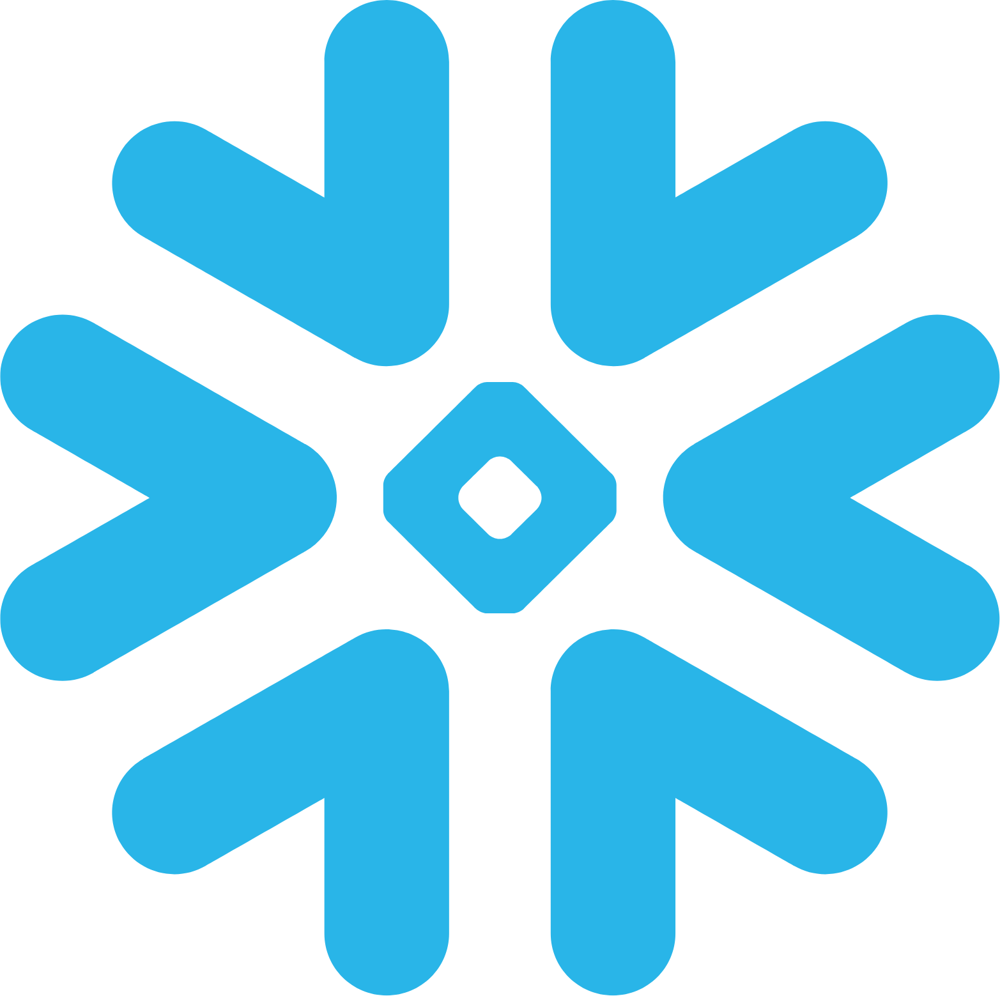

In [129]:
# Create evaluation table
evaluation = {
    'Model': ['Random Forest', 'XGBoost'],
    'MSE': [rf_best_mse, xgb_best_mse],
    'RMSE': [rf_best_rmse, xgb_best_rmse],
    'MAE': [rf_best_mae, xgb_best_mae],
    'R²': [rf_best_r2, xgb_best_r2]
}

evaluation_df = pd.DataFrame(evaluation)
print("\nModel Comparison:")
evaluation_df

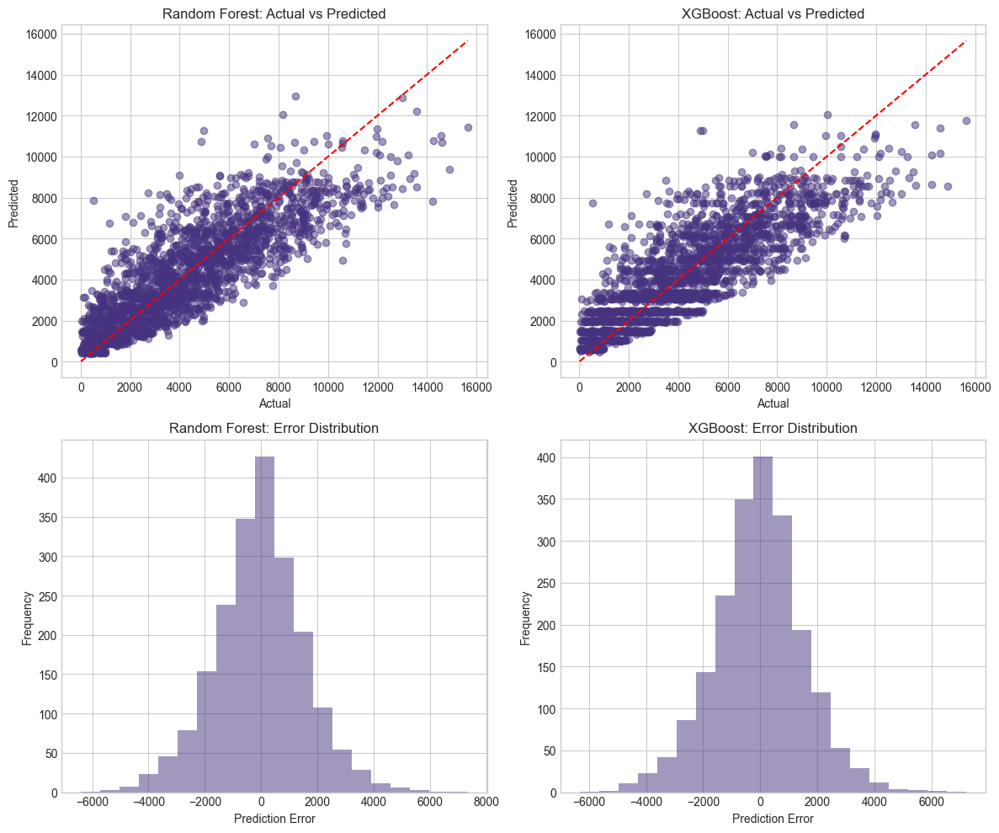

In [130]:
# Create visualization comparing model performance
plt.figure(figsize=(12, 10))

# 1. Actual vs Predicted for Random Forest
plt.subplot(2, 2, 1)
plt.scatter(y_test, rf_best_predictions, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title('Random Forest: Actual vs Predicted')
plt.xlabel('Actual')
plt.ylabel('Predicted')

# 2. Actual vs Predicted for XGBoost
plt.subplot(2, 2, 2)
plt.scatter(y_test, xgb_best_predictions, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title('XGBoost: Actual vs Predicted')
plt.xlabel('Actual')
plt.ylabel('Predicted')

# 3. Error distribution for Random Forest
plt.subplot(2, 2, 3)
plt.hist(rf_best_predictions - y_test, bins=20, alpha=0.5)
plt.title('Random Forest: Error Distribution')
plt.xlabel('Prediction Error')
plt.ylabel('Frequency')

# 4. Error distribution for XGBoost
plt.subplot(2, 2, 4)
plt.hist(xgb_best_predictions - y_test, bins=20, alpha=0.5)
plt.title('XGBoost: Error Distribution')
plt.xlabel('Prediction Error')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

### `Feature importance analysis`

In [131]:
# Determine which model performed better
if rf_best_r2 > xgb_best_r2:
    best_model = rf_best_model
    best_model_name = 'Random Forest'
    best_predictions = rf_best_predictions
else:
    best_model = xgb_best_model
    best_model_name = 'XGBoost'
    best_predictions = xgb_best_predictions

print(f"\nBest model: {best_model_name} with R² = {max(rf_best_r2, xgb_best_r2):.4f}")


Best model: XGBoost with R² = 0.7034


In [133]:
# Extract feature importances
if best_model_name == 'Random Forest':
    importances = best_model.named_steps['model'].feature_importances_
else:
    importances = best_model.named_steps['model'].feature_importances_

In [135]:
print("Length of features:", len(features))
print("Length of importances:", len(importances))

Length of features: 6
Length of importances: 4


In [138]:
# Fix if features has more elements than importances
features = features[:len(importances)]

2025-05-21 15:16:13.988 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.



Feature Importance:



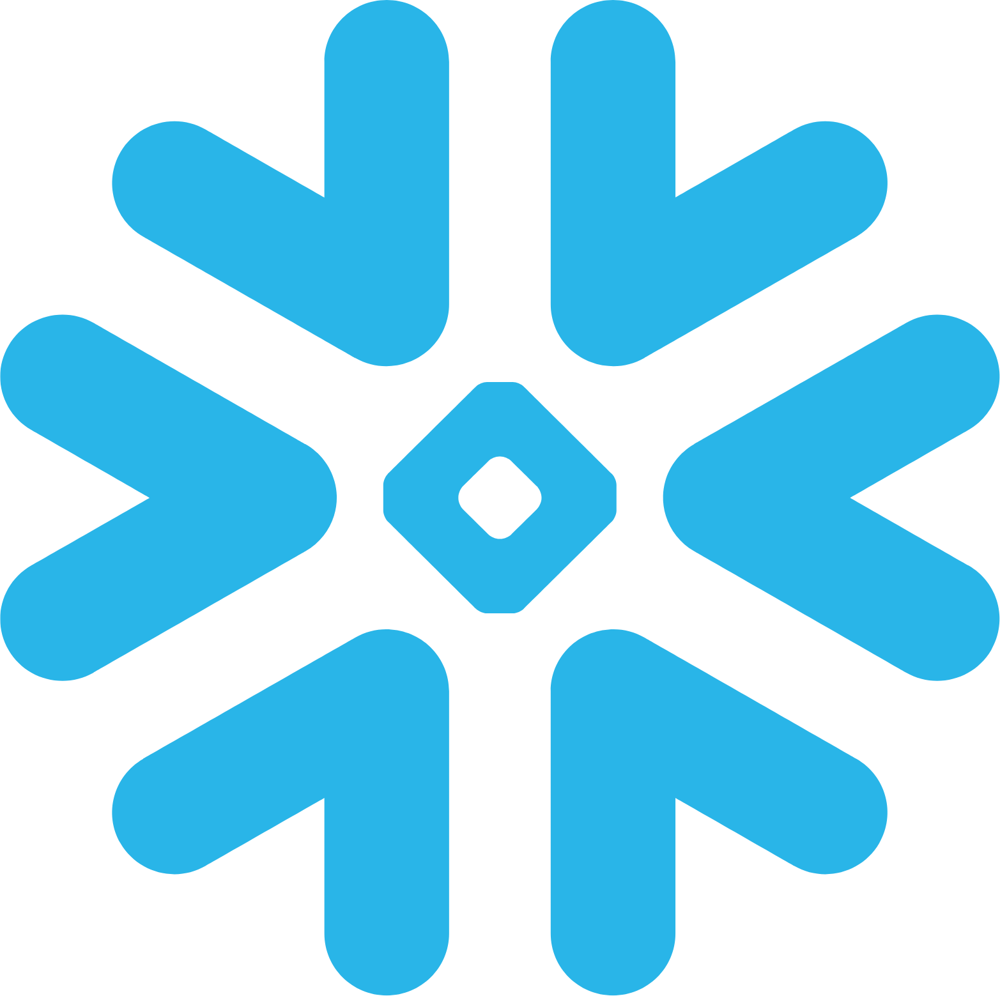

In [139]:
# Create a DataFrame of feature importances
feature_importances = pd.DataFrame({
    'Feature': features,
    'Importance': importances
})
feature_importances = feature_importances.sort_values('Importance', ascending=False)

print("\nFeature Importance:")
feature_importances

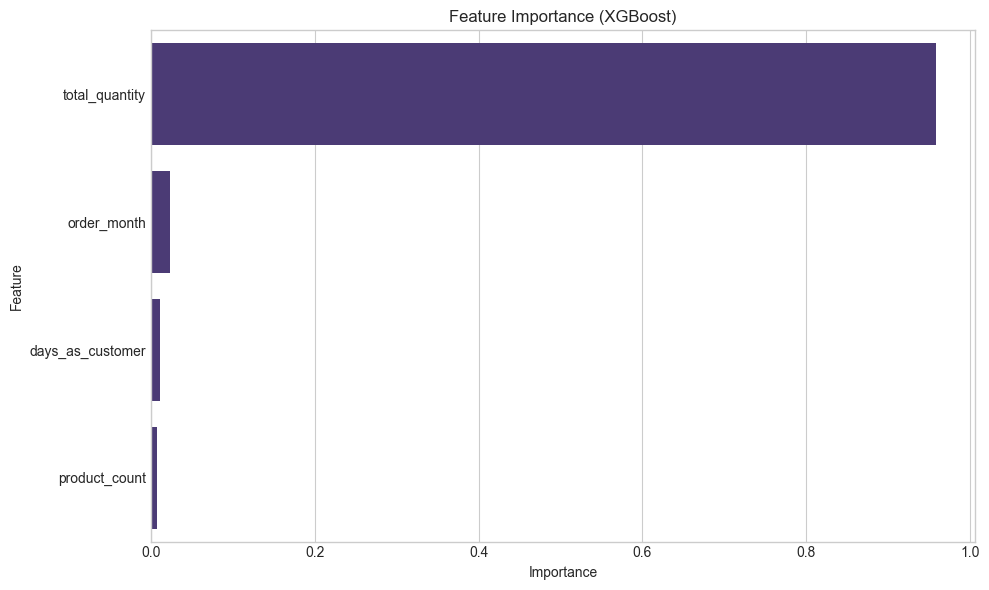

In [140]:
# Plot feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importances)
plt.title(f'Feature Importance ({best_model_name})')
plt.tight_layout()
plt.show()

### `Save the best model for deployment`

In [141]:
# Save best model
model_filename = 'ecommerce_best_model.pkl'
joblib.dump(best_model, model_filename)
print(f"\nBest model saved to {model_filename}")


Best model saved to ecommerce_best_model.pkl


In [142]:
# Create a function for making predictions with the saved model
def predict_order_amount(days_as_customer, product_count, total_quantity, 
                         order_month, order_day_of_week, customer_avg_order):
    """
    Make predictions using the saved model
    """
    # Load the model
    model = joblib.load(model_filename)
    
    # Create input data
    input_data = pd.DataFrame({
        'days_as_customer': [days_as_customer],
        'product_count': [product_count],
        'total_quantity': [total_quantity],
        'order_month': [order_month],
        'order_day_of_week': [order_day_of_week],
        'customer_avg_order': [customer_avg_order]
    })
    
    # Make prediction
    prediction = model.predict(input_data)
    
    return prediction[0]

# Example usage
example_prediction = predict_order_amount(
    days_as_customer=30,
    product_count=2,
    total_quantity=3,
    order_month=5,
    order_day_of_week=2,
    customer_avg_order=150
)

print(f"\nExample prediction for new order: ${example_prediction:.2f}")


Example prediction for new order: $1447.90
